In [35]:
import os
import librosa
import matplotlib.pyplot as plt
import IPython.display as ipd
import numpy as np
from tqdm import tqdm
import pandas as pd

# Audio Tests

In [76]:
targets = pd.read_csv('./dataset/annotations/averaged/song_level/static_annotations_averaged_songs_1_2000.csv')
targets2 = pd.read_csv('./dataset/annotations/averaged/song_level/static_annotations_averaged_songs_2000_2058.csv')

In [81]:
target = pd.concat([targets, targets2[['song_id', ' valence_mean', ' valence_std', ' arousal_mean', ' arousal_std']]])

In [54]:
target

,song_id,valence_mean,valence_std,arousal_mean,arousal_std
0,2,3.10,0.94,3.00,0.63
1,3,3.50,1.75,3.30,1.62
2,4,5.70,1.42,5.50,1.63
3,5,4.40,2.01,5.30,1.85
4,7,5.80,1.47,6.40,1.69
...,...,...,...,...,...
53,2054,5.40,1.20,3.60,1.36
54,2055,5.00,1.41,5.20,1.47
55,2056,5.00,1.41,4.60,1.74
56,2057,3.17,1.07,6.83,0.37


In [58]:
target.columns = target.columns.str.strip()

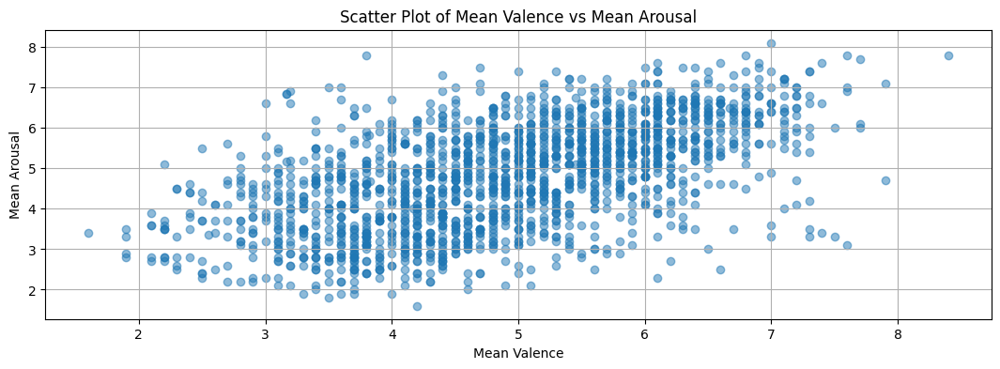

In [60]:
plt.figure(figsize=(13, 4))

# Scatter plot
plt.scatter(target['valence_mean'], target['arousal_mean'], alpha=0.5)
plt.title('Scatter Plot of Mean Valence vs Mean Arousal')
plt.xlabel('Mean Valence')
plt.ylabel('Mean Arousal')
plt.grid(True)
plt.show()

In [2]:
audio_directory = './dataset/MEMD_audio/'

start_number = 1
end_number = 2058

audio_dict = {}

for file_number in tqdm(range(start_number, end_number + 1), desc="Processing audio files"):
    audio_path = f'{audio_directory}{file_number}.mp3'

    try:
        y, sr = librosa.load(audio_path, sr=20000, duration=25.0)  # Set duration to 30 seconds
        audio_dict[file_number] = (y, sr)

    except FileNotFoundError:
        continue

Processing audio files:   0%|                                                                 | 0/2058 [00:00<?, ?it/s]C:\Users\ASUS\AppData\Local\Temp\ipykernel_17068\142974482.py:12: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_path, sr=20000, duration=25.0)  # Set duration to 30 seconds
c:\python39\lib\site-packages\librosa\core\audio.py:183: FutureWarning: librosa.core.audio.__audioread_load
	Deprecated as of librosa version 0.10.0.
	It will be removed in librosa version 1.0.
  y, sr_native = __audioread_load(path, offset, duration, dtype)
Processing audio files:   0%|▏                                                        | 5/2058 [00:04<20:54,  1.64it/s]C:\Users\ASUS\AppData\Local\Temp\ipykernel_17068\142974482.py:12: UserWarning: PySoundFile failed. Trying audioread instead.
  y, sr = librosa.load(audio_path, sr=20000, duration=25.0)  # Set duration to 30 seconds
c:\python39\lib\site-packages\librosa\core\audio.py:183: FutureWarning: l

In [4]:
len(audio_dict)

1802

In [31]:
def play_audio(track):
    return ipd.Audio(f'./dataset/MEMD_audio/{track}.mp3')    

In [32]:
play_audio(2)

25 seconds, each second 20000 samples

In [9]:
len(audio_dict[2][0])

500000

In [10]:
audio_dict[2][1]

20000

## Short Time Fourier Transform

In [11]:
FRAME_SIZE = 2048
HOP_SIZE = 512

In [12]:
Y_scale_dict = {}

for file_number, (audio_data, sr) in tqdm(audio_dict.items(), desc='Calculating squared magnitude', unit='file', leave=False):
    stft = librosa.stft(audio_data, n_fft=FRAME_SIZE, hop_length=HOP_SIZE)
    Y_scale_dict[file_number] = np.abs(stft) ** 2

(time frames, frequency bins)

In [13]:
Y_scale_dict[2].shape

(1025, 977)

In [15]:
type(Y_scale_dict[2][0][0])

numpy.float32

## Calculate Spectogram 

In [22]:
def plot_spectogram(Y, sr, hop_length, y_axis='linear'):
    plt.figure(figsize=(20, 6))
    librosa.display.specshow(Y,
                            sr=sr,
                            hop_length=hop_length,
                            x_axis='time',
                            y_axis=y_axis)
    plt.colorbar(format='%+2.f')

## Log Amplitude Spectogram

Applying a logarithmic scale to the spectrogram is a common practice in audio processing. The reason for this is rooted in human perception. Our ears and brain perceive changes in loudness on a logarithmic scale, not a linear one.

In [20]:
Y_log_scale_dict = {}

for file_number, Y_scale in tqdm(Y_scale_dict.items(), unit='file', leave=False):
    Y_log_scale = librosa.power_to_db(Y_scale)
    Y_log_scale_dict[file_number] = Y_log_scale

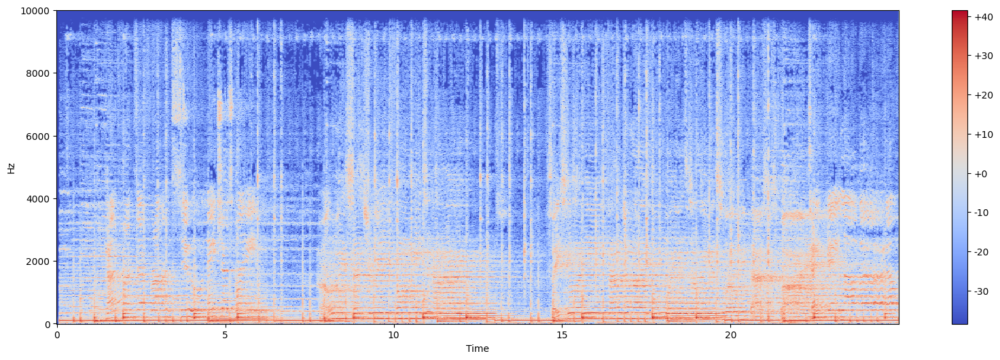

In [77]:
plot_spectogram(Y_log_scale_dict[2], 20000, HOP_SIZE)

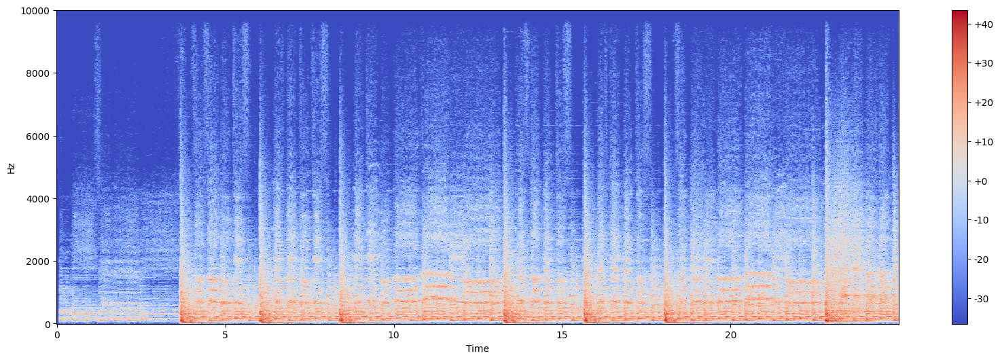

In [26]:
plot_spectogram(Y_log_scale_dict[243], 20000, HOP_SIZE)

High Valence <br>
Low Arousal

In [34]:
play_audio(253)

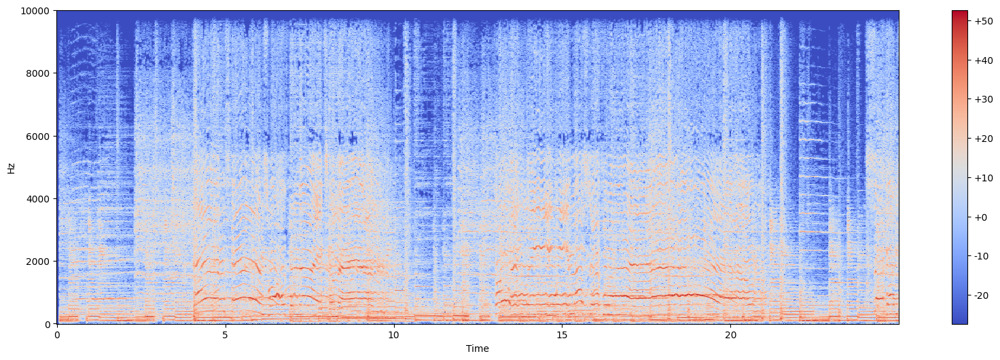

In [27]:
plot_spectogram(Y_log_scale_dict[253], 20000, HOP_SIZE)

Low Valence <br>
Low Arousal

In [61]:
target[target['song_id'] == 178]

,song_id,valence_mean,valence_std,arousal_mean,arousal_std
147,178,2.8,2.09,3.7,2.1


In [33]:
play_audio(178)

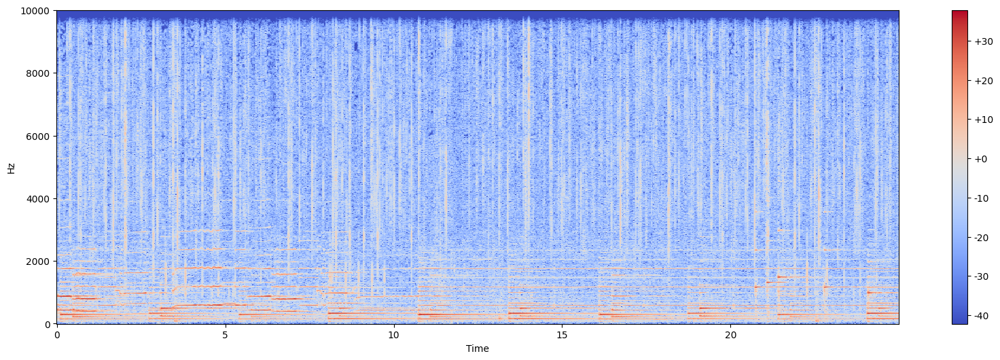

In [28]:
plot_spectogram(Y_log_scale_dict[178], 20000, HOP_SIZE)

Low Valence <br>
High Arousal

In [68]:
play_audio(402)

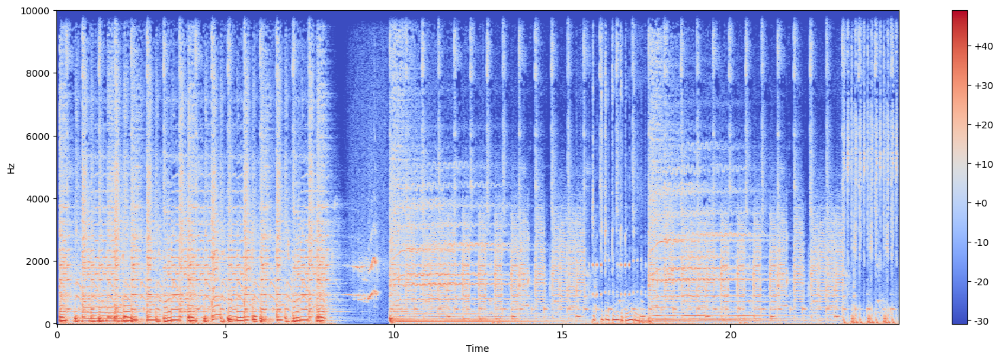

In [69]:
plot_spectogram(Y_log_scale_dict[402], 20000, HOP_SIZE)

## Saving Spectograms

In [109]:
import gc
gc.collect()

11721

In [110]:
save_directory = './log_spectrogram_plots/'

for file_number, Y_log_scale in tqdm(Y_log_scale_dict.items(), desc='Plotting and Saving Log-scaled Spectrograms', unit='file', leave=False):
    plt.figure(figsize=(10, 4))
    librosa.display.specshow(Y_log_scale, sr=sr, hop_length=HOP_SIZE, x_axis='time', y_axis='log')
    plt.colorbar(format='%+2.0f dB')
    plt.title(f'Log-scaled Spectrogram for File {file_number}')
    
    # Save the plot
    save_path = f'{save_directory}log_spectrogram_{file_number}.png'
    plt.savefig(save_path)
    del save_path
    plt.clf()
    plt.close('all')
    gc.collect()